In [1]:
library(tidyverse)
library(broom)
library(repr)
library(digest)
library(infer)
library('dplyr')
library(dplyr)
library(gridExtra)
library(RColorBrewer)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.4 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [42]:
url <- "https://raw.githubusercontent.com/SG0707/STAT-201-Group-project-/main/crimedata_csv_AllNeighbourhoods_2022.csv"
crime_data <- read_csv(url)

Rows: 34189 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): TYPE, HUNDRED_BLOCK, NEIGHBOURHOOD
dbl (7): YEAR, MONTH, DAY, HOUR, MINUTE, X, Y

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [43]:
set.seed(5)

# Add a time period variable based on the hour of the day
crime_data <- crime_data %>%
  mutate(time_period = case_when(
    HOUR >= 0 & HOUR < 6 ~ "Night",
    HOUR >= 6 & HOUR < 12 ~ "Morning",
    HOUR >= 12 & HOUR < 18 ~ "Afternoon",
    HOUR >= 18 & HOUR <= 23 ~ "Evening"
  ))


In [44]:
# Create a new variable for crime severity

set.seed(5)
# Type is servrity of crimes, categorical variable
# mischief and theft(all) 1
# break and enter 2
# offense against a person/Vehicle Collision or Pedestrian Struck (with Injury)/homicide/Vehicle Collision or Pedestrian Struck (with Fatality)  3


for(i in 1:length(crime_data$TYPE)){
  if(crime_data$TYPE[i] %in% c("Mischief", "Other Theft", "Theft from Vehicle", "Theft of Bicycle", "Theft of Vehicle")) {crime_data$TYPE[i] = 1}
  if(crime_data$TYPE[i] %in% c("Break and Enter Commercial", "Break and Enter Residential/Other")) {crime_data$TYPE[i] = 2}
  if(crime_data$TYPE[i] %in% c("Offence Against a Person", "Vehicle Collision or Pedestrian Struck (with Injury)","Homicide", 
                         "Vehicle Collision or Pedestrian Struck (with Fatality)")) {crime_data$TYPE[i] = 3}
}



In [ ]:
crime_data <- crime_data %>% 
        rename(severity = TYPE)



# Convert the severity variable to numeric

crime_data$severity = as.numeric(as.character(crime_data$severity))

head(crime_data) 

ERROR: Error in rename(., severity = TYPE): object 'crime_data' not found


In [46]:
set.seed(15)

# Filter out rows with missing values in NEIGHBOURHOOD column
crime_data <- crime_data %>%
  select(severity, time_period, NEIGHBOURHOOD) %>%

  filter(!is.na(NEIGHBOURHOOD))

head(crime_data) 

severity,time_period,NEIGHBOURHOOD
<dbl>,<chr>,<chr>
1,Evening,Kitsilano
1,Night,Kitsilano
1,Night,Kitsilano
1,Evening,Kitsilano
1,Evening,Kitsilano
1,Afternoon,Kitsilano


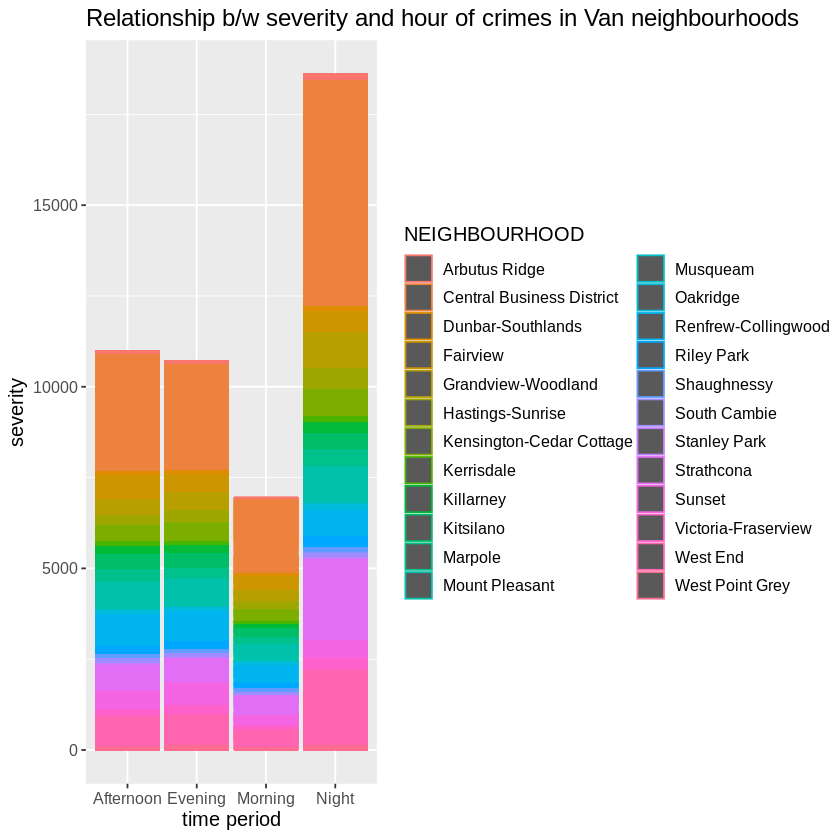

In [47]:
data_pop_dist <- ggplot(crime_data, aes( x = time_period, 
                                        y = severity, 
                                       color = NEIGHBOURHOOD)) +
  geom_bar(stat = "identity") +
  labs(x = "time period", y = "severity", fill = "neighborhood") +
  ggtitle("Relationship b/w severity and hour of crimes in Van neighbourhoods") + 
  theme(text = element_text(size = 12))

data_pop_dist

In [48]:
set.seed(5)

# Calculate the mean severity of crimes for each time period
mean_severity <- crime_data %>%
  group_by(time_period) %>%
  summarize(mean_severity = mean(severity, na.rm = TRUE))

mean_severity

time_period,mean_severity
<chr>,<dbl>
Afternoon,1.147409
Evening,1.131376
Morning,1.215360
Night,1.973908


In [52]:
set.seed(5)

# Calculate the standard deviation of crime severity for each time period
sd_severity <- crime_data %>%
  group_by(time_period) %>%
  summarize(sd_severity = sd(severity, na.rm = TRUE))

sd_severity 

time_period,sd_severity
<fct>,<dbl>
Afternoon,0.4574698
Evening,0.4132072
Morning,0.5099005
Night,0.9327431
